<a href="https://colab.research.google.com/github/Bheemeshwari/ai-project/blob/main/detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install opencv-python opencv-contrib-python numpy
!pip install opencv-python

In [ ]:
!pip install times

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 4.9 MB/s eta 0:00:00


In [ ]:
!pip install numpy

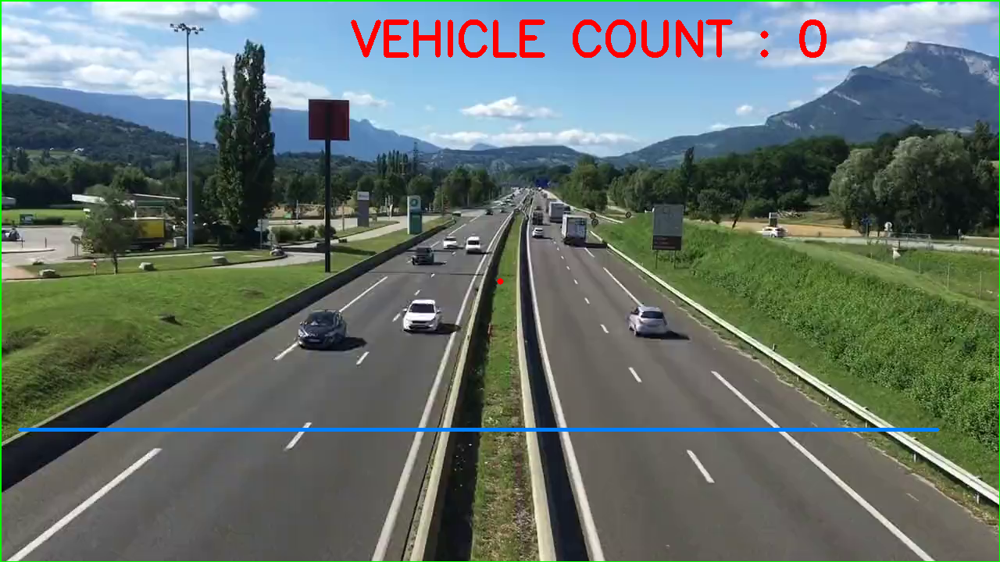

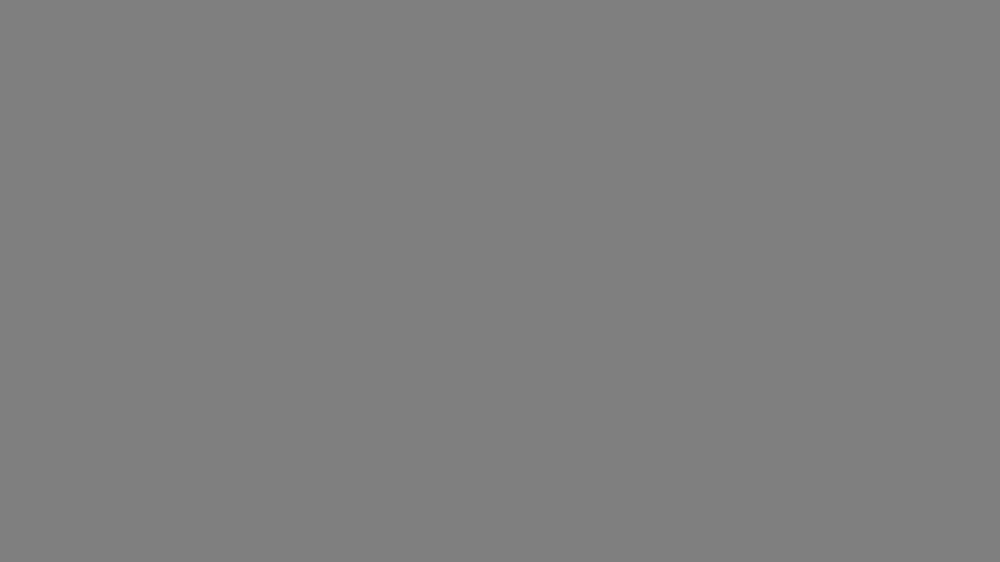

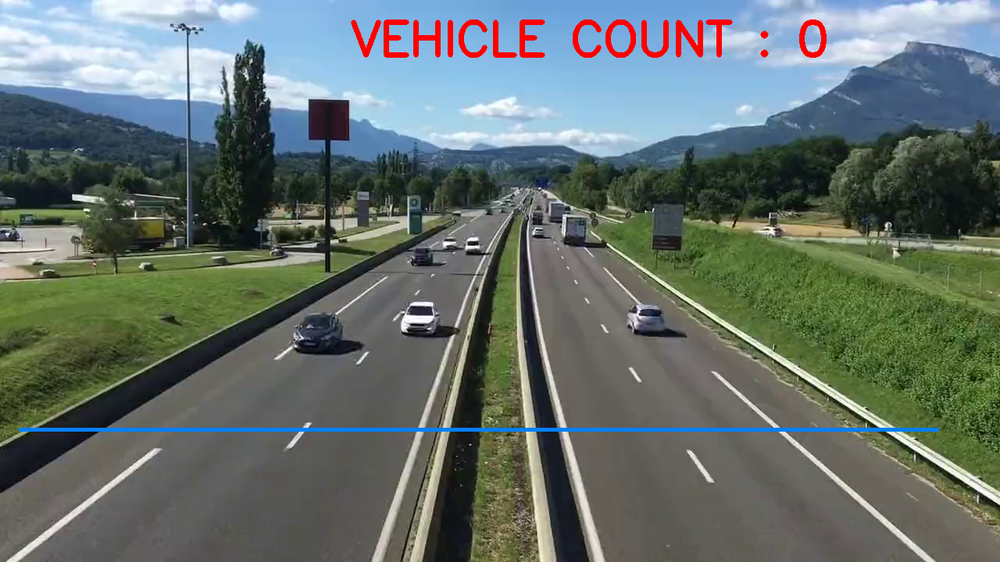

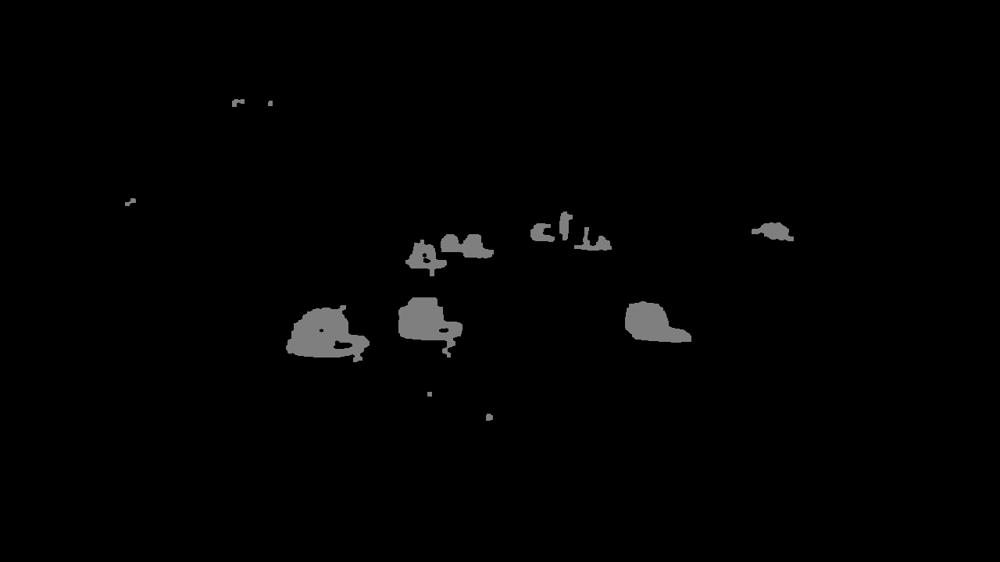

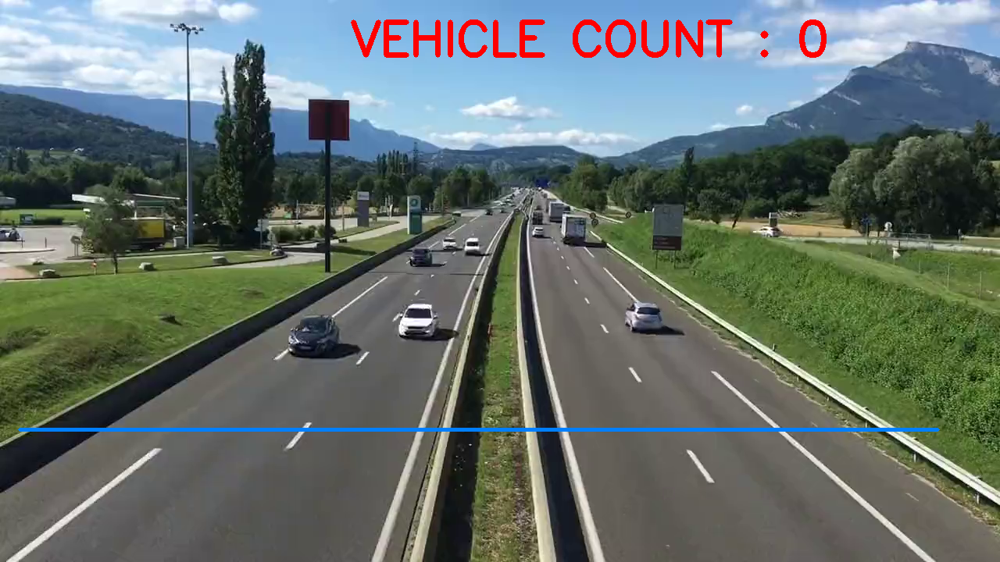

...

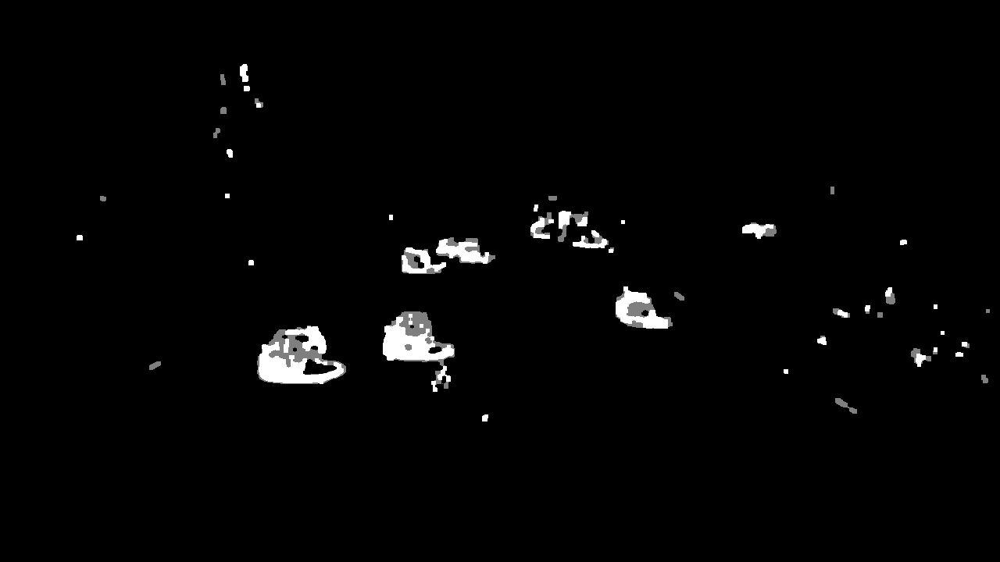

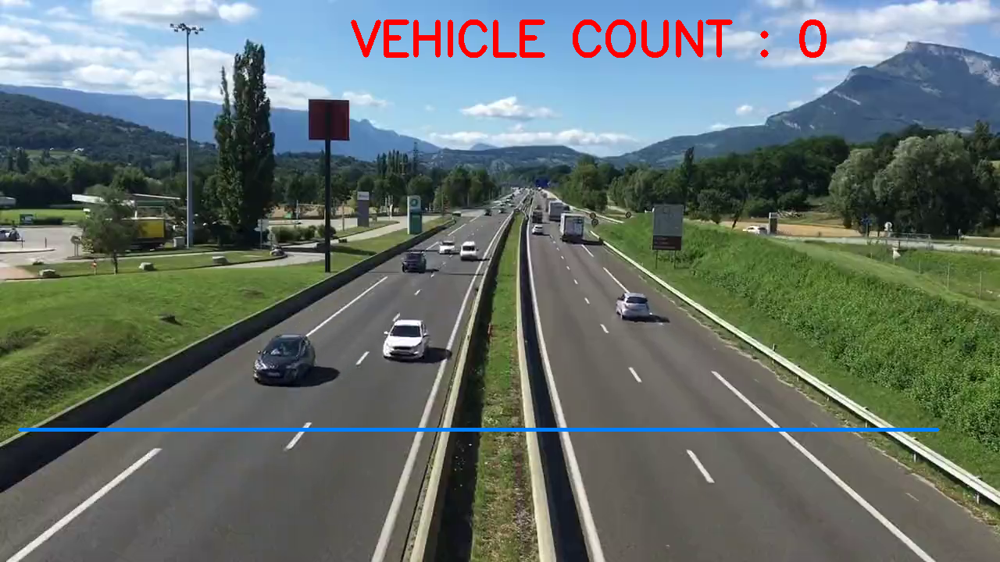

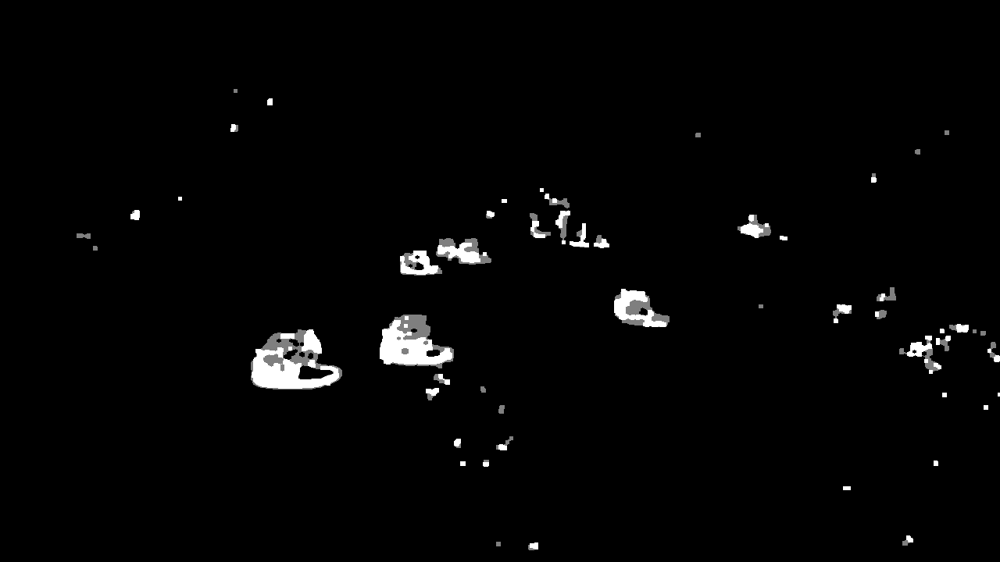

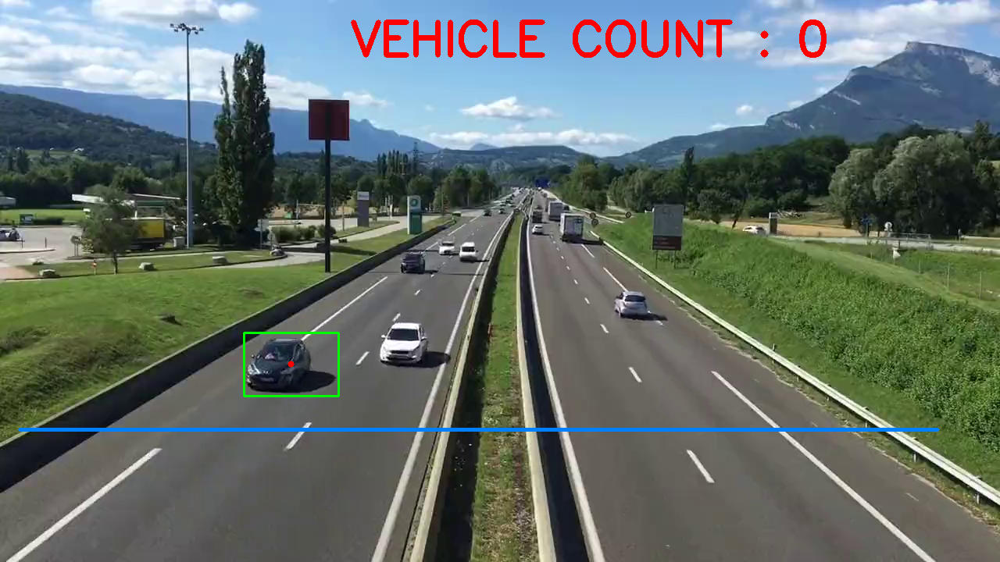

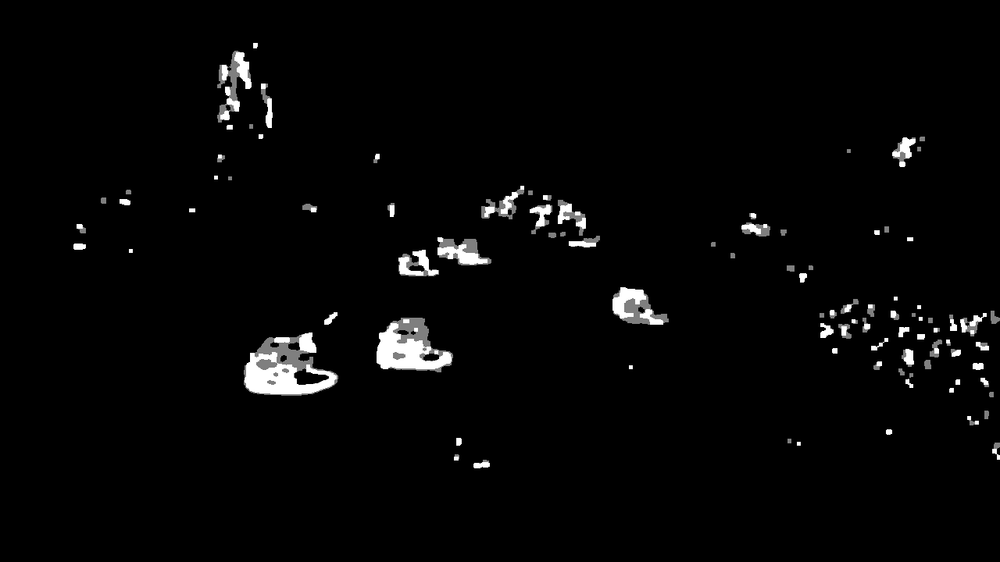

In [ ]:
import cv2
import numpy as np
from time import sleep
# Import the cv2_imshow function from google.colab.patches
from google.colab.patches import cv2_imshow


largura_min=80 #Largura minima do retangulo
altura_min=80 #Altura minima do retangulo

offset=6 #Erro permitido entre pixel

pos_linha=550 #Posição da linha de contagem

delay= 60 #FPS do vídeo

detec = []
carros= 0


def pega_centro(x, y, w, h):
    x1 = int(w / 2)
    y1 = int(h / 2)
    cx = x + x1
    cy = y + y1
    return cx,cy

cap = cv2.VideoCapture('video.mp4')
subtracao = cv2.createBackgroundSubtractorMOG2()

while True:
    ret , frame1 = cap.read()
    tempo = float(1/delay)
    sleep(tempo)
    grey = cv2.cvtColor(frame1,cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(grey,(3,3),5)
    img_sub = subtracao.apply(blur)
    dilat = cv2.dilate(img_sub,np.ones((5,5)))
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    dilatada = cv2.morphologyEx (dilat, cv2. MORPH_CLOSE , kernel)
    dilatada = cv2.morphologyEx (dilatada, cv2. MORPH_CLOSE , kernel)
    contorno,h=cv2.findContours(dilatada,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)

    cv2.line(frame1, (25, pos_linha), (1200, pos_linha), (255,127,0), 3)
    for(i,c) in enumerate(contorno):
        (x,y,w,h) = cv2.boundingRect(c)
        validar_contorno = (w >= largura_min) and (h >= altura_min)
        if not validar_contorno:
            continue

        cv2.rectangle(frame1,(x,y),(x+w,y+h),(0,255,0),2)
        centro = pega_centro(x, y, w, h)
        detec.append(centro)
        cv2.circle(frame1, centro, 4, (0, 0,255), -1)

        for (x,y) in detec:
            if y<(pos_linha+offset) and y>(pos_linha-offset):
                carros+=1
                cv2.line(frame1, (25, pos_linha), (1200, pos_linha), (0,127,255), 3)
                detec.remove((x,y))
                print("car is detected : "+str(carros))

    cv2.putText(frame1, "VEHICLE COUNT : "+str(carros), (450, 70), cv2.FONT_HERSHEY_SIMPLEX, 2, (0, 0, 255),5)
    # Replace cv2.imshow with cv2_imshow
    cv2_imshow(frame1)
    cv2_imshow(dilatada)

    if cv2.waitKey(1) == 27:
        break

cv2.destroyAllWindows()
cap.release()

In [ ]:
display_interval = 10  # Display every 10th frame
frame_counter = 0

# ... (Inside the loop)

frame_counter += 1
if frame_counter % display_interval == 0:
    cv2_imshow(frame1)
    cv2_imshow(dilatada)